# Visual Search demo

<img src="logo.png" width=350>

## 2. Visual search examples
The page demonstrates how to build a fashion visual search system using Azure AI Vision and Azure AI Search through text or image queries.

## Visual search with vector embeddings
Vector embeddings are a way of representing content such as text or images as vectors of real numbers in a high-dimensional space. These embeddings are often learned from large amounts of textual and visual data using machine learning algorithms like neural networks. Each dimension of the vector corresponds to a different feature or attribute of the content, such as its semantic meaning, syntactic role, or context in which it commonly appears. By representing content as vectors, we can perform mathematical operations on them to compare their similarity or use them as inputs to machine learning models.

## Business applications
- Digital asset management: Image retrieval can be used to manage large collections of digital images, such as in museums, archives, or online galleries. Users can search for images based on visual features and retrieve the images that match their criteria.
- Medical image retrieval: Image retrieval can be used in medical imaging to search for images based on their diagnostic features or disease patterns. This can help doctors or researchers to identify similar cases or track disease progression.
- Security and surveillance: Image retrieval can be used in security and surveillance systems to search for images based on specific features or patterns, such as in, people & object tracking, or threat detection.
- Forensic image retrieval: Image retrieval can be used in forensic investigations to search for images based on their visual content or metadata, such as in cases of cyber-crime.
- E-commerce: Image retrieval can be used in online shopping applications to search for similar products based on their features or descriptions or provide recommendations based on previous purchases.
- Fashion and design: Image retrieval can be used in fashion and design to search for images based on their visual features, such as color, pattern, or texture. This can help designers or retailers to identify similar products or trends.

## Images
In this notebook we took some samples fashion images are taken from this link:<br>
https://www.kaggle.com/datasets/paramaggarwal/fashion-product-images-dataset

In [2]:
import datetime
import os
import sys

from azurevisualsearch import get_index_status, get_index_stats, visual_search_text, visual_search_image, view_search_results
from azure.storage.blob import BlobServiceClient
from dotenv import load_dotenv
from PIL import Image

In [3]:
print(f"Today is {datetime.datetime.now().strftime('%Y-%m-%d')}")

Today is 2025-07-30


In [4]:
print(f"Python version: {sys.version}")

Python version: 3.10.14 (main, May  6 2024, 19:42:50) [GCC 11.2.0]


## 1. Azure AI Services

In [5]:
load_dotenv("azure.env")

# Azure AI Vision
azure_vision_key = os.getenv("azure_vision_key")
azure_vision_endpoint = os.getenv("azure_vision_endpoint")
api_version = "2024-02-01"
model_version = "2023-04-15"

# Azure AI Search
azure_search_endpoint = os.getenv("azure_search_endpoint")
index_name = "fashion-demo-2025"

In [6]:
# Azure storage account
blob_connection_string = os.getenv("blob_connection_string")
container_name = os.getenv("container_name")

blob_service_client = BlobServiceClient.from_connection_string(blob_connection_string)
container_client = blob_service_client.get_container_client(container_name)

In [7]:
IMAGES_DIR = "images"
IMAGES_TEST_DIR = "sources"

## 2. Azure AI Search

### Azure AI Search index status

In [8]:
document_count, storage_size = get_index_stats(index_name)

📡 Azure AI Search index status for: fashion-demo-2025

{
  "@odata.context": "https://azureaisearch-sr.search.windows.net/$metadata#Microsoft.Azure.Search.V2024_07_01.IndexStatistics",
  "documentCount": 10226,
  "storageSize": 115931376,
  "vectorIndexSize": 42451784
}


In [9]:
print(f"🔢 Number of documents in the index = {document_count:,}")
print(f"📏 Size of the index = {storage_size / (1024 * 1024):.2f} MB")

🔢 Number of documents in the index = 10,226
📏 Size of the index = 110.56 MB


In [10]:
get_index_status(index_name)

Azure AI Search Index: fashion-demo-2025

{
     "@odata.context": "https://azureaisearch-sr.search.windows.net/$metadata#indexes/$entity",
     "@odata.etag": "\"0x8DDCF67D67B39AB\"",
     "name": "fashion-demo-2025",
     "defaultScoringProfile": null,
     "fields": [
          {
               "name": "idfile",
               "type": "Edm.String",
               "searchable": false,
               "filterable": false,
               "retrievable": true,
               "stored": true,
               "sortable": false,
               "facetable": false,
               "key": true,
               "indexAnalyzer": null,
               "searchAnalyzer": null,
               "analyzer": null,
               "dimensions": null,
               "vectorSearchProfile": null,
               "vectorEncoding": null,
               "synonymMaps": []
          },
          {
               "name": "imagefile",
               "type": "Edm.String",
               "searchable": false,
               

## 3. Visual Search using a text prompt

In [10]:
text = "A blue male shirt with long sleeves"

results = visual_search_text(index_name, text, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0392938029.jpg | 🔗 Cosine Similarity = 0.62140
✅ Top 02: fashion/0395127028.jpg | 🔗 Cosine Similarity = 0.61579
✅ Top 03: fashion/0395127042.jpg | 🔗 Cosine Similarity = 0.61509
✅ Top 04: fashion/0395127013.jpg | 🔗 Cosine Similarity = 0.61503
✅ Top 05: fashion/0693218001.jpg | 🔗 Cosine Similarity = 0.61459
✅ Top 06: fashion/0395127011.jpg | 🔗 Cosine Similarity = 0.61428




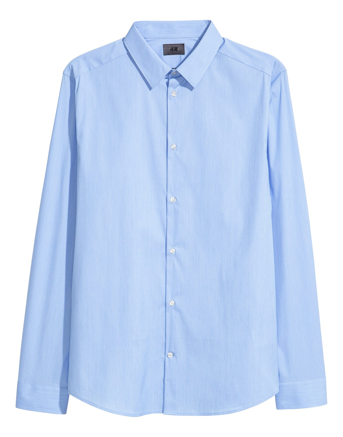
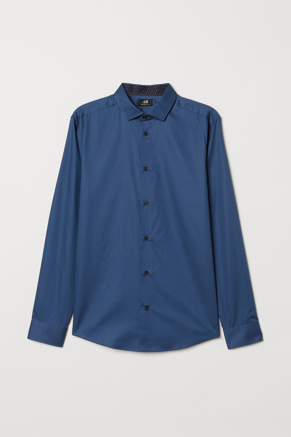
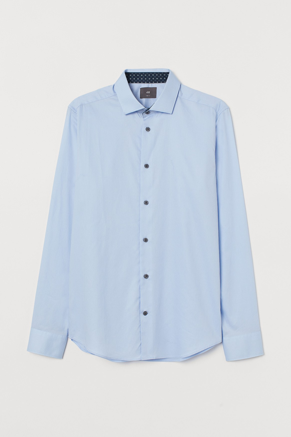
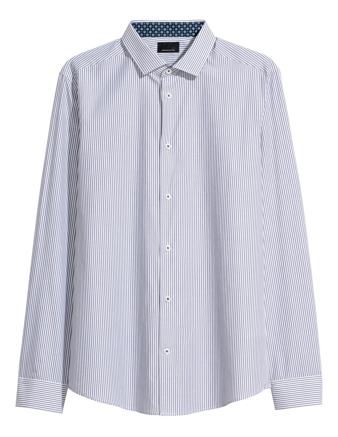
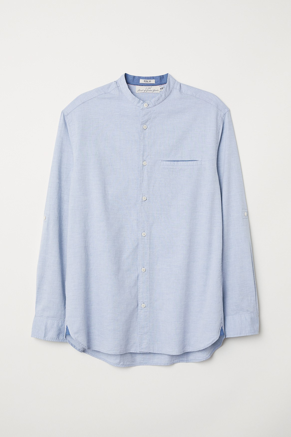
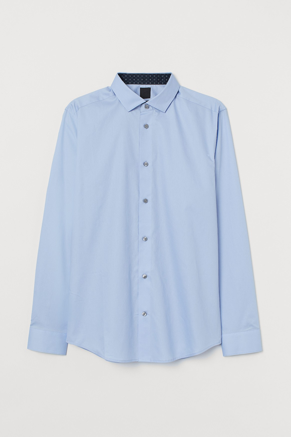

In [11]:
view_search_results(results)

In [12]:
text = "Brown trousers for male"

results = visual_search_text(index_name, text, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0623218003.jpg | 🔗 Cosine Similarity = 0.62028
✅ Top 02: fashion/0692842009.jpg | 🔗 Cosine Similarity = 0.61953
✅ Top 03: fashion/0626706003.jpg | 🔗 Cosine Similarity = 0.61946
✅ Top 04: fashion/0628642003.jpg | 🔗 Cosine Similarity = 0.61912
✅ Top 05: fashion/0691343004.jpg | 🔗 Cosine Similarity = 0.61852
✅ Top 06: fashion/0395619013.jpg | 🔗 Cosine Similarity = 0.61828




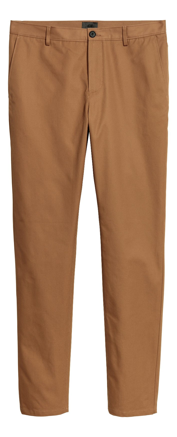
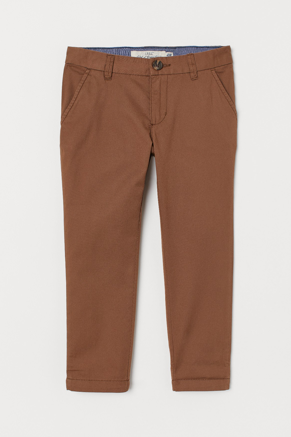
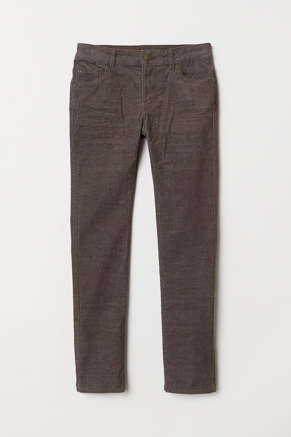
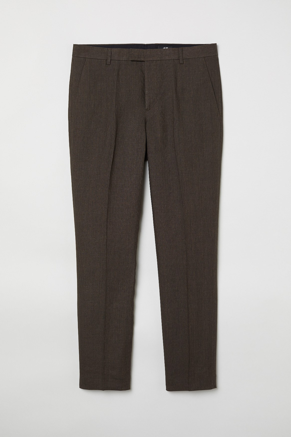
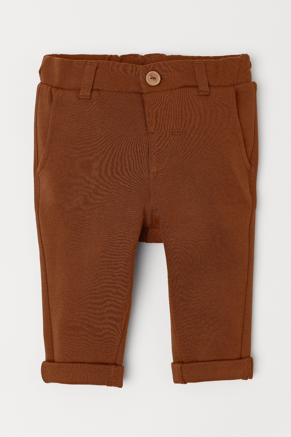
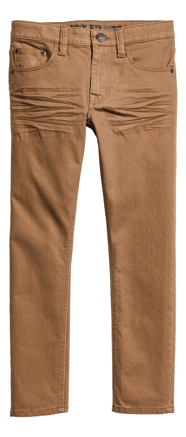

In [13]:
view_search_results(results)

In [14]:
text = "I want some funny sneakers."

results = visual_search_text(index_name, text, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0646720001.jpg | 🔗 Cosine Similarity = 0.60851
✅ Top 02: fashion/0625870004.jpg | 🔗 Cosine Similarity = 0.60835
✅ Top 03: fashion/0626297001.jpg | 🔗 Cosine Similarity = 0.60805
✅ Top 04: fashion/0624507002.jpg | 🔗 Cosine Similarity = 0.60722
✅ Top 05: fashion/0625870003.jpg | 🔗 Cosine Similarity = 0.60665
✅ Top 06: fashion/0691730001.jpg | 🔗 Cosine Similarity = 0.60665




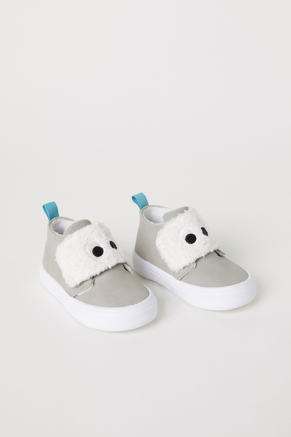
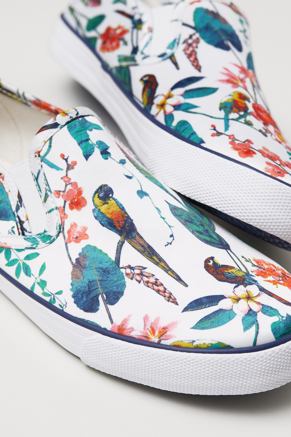
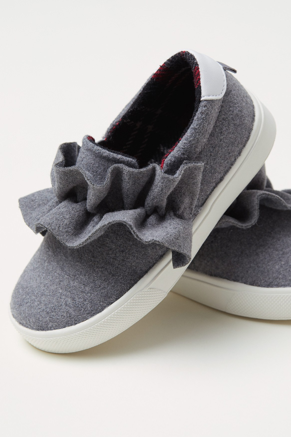
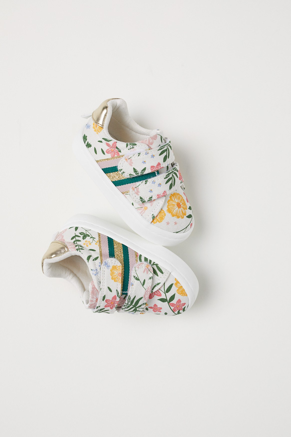
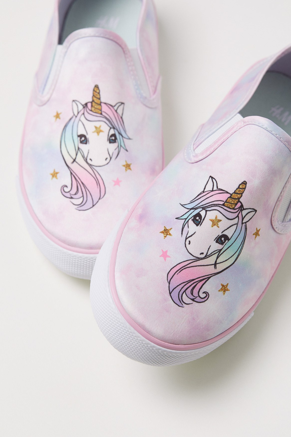
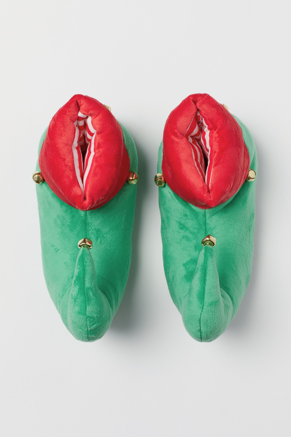

In [15]:
view_search_results(results)

In [16]:
text = "I want a NYC hat."

results = visual_search_text(index_name, text, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0625068002.jpg | 🔗 Cosine Similarity = 0.62528
✅ Top 02: fashion/0694659051.jpg | 🔗 Cosine Similarity = 0.61867
✅ Top 03: fashion/0694739001.jpg | 🔗 Cosine Similarity = 0.61779
✅ Top 04: fashion/0391032009.jpg | 🔗 Cosine Similarity = 0.61749
✅ Top 05: fashion/0694739028.jpg | 🔗 Cosine Similarity = 0.61617
✅ Top 06: fashion/0694739004.jpg | 🔗 Cosine Similarity = 0.61556




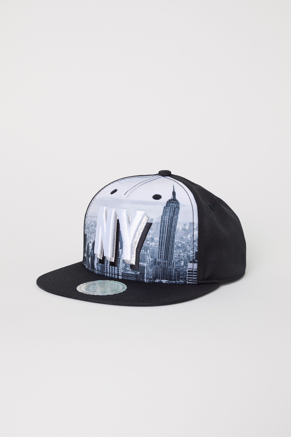
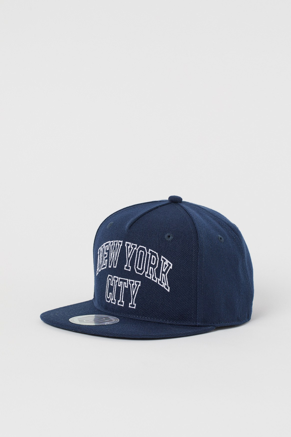
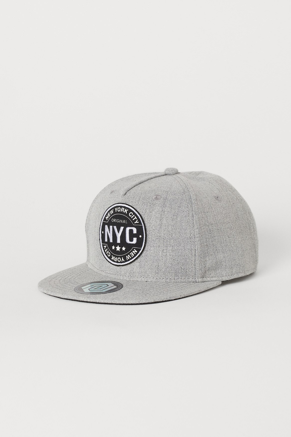
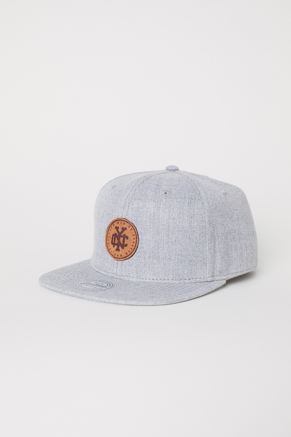
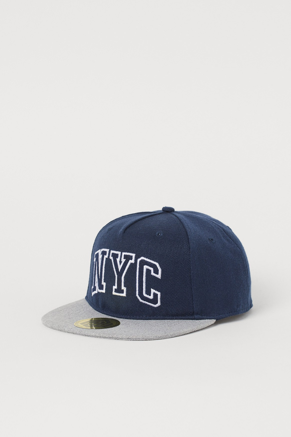
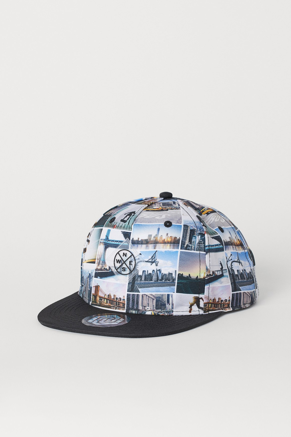

In [17]:
view_search_results(results)

In [18]:
text = "Articles with birds"

results = visual_search_text(index_name, text, topn=9)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0625870004.jpg | 🔗 Cosine Similarity = 0.60267
✅ Top 02: fashion/0691009005.jpg | 🔗 Cosine Similarity = 0.60023
✅ Top 03: fashion/0398559008.jpg | 🔗 Cosine Similarity = 0.59745
✅ Top 04: fashion/0622890003.jpg | 🔗 Cosine Similarity = 0.59735
✅ Top 05: fashion/0649052001.jpg | 🔗 Cosine Similarity = 0.59686
✅ Top 06: fashion/0646789005.jpg | 🔗 Cosine Similarity = 0.59652
✅ Top 07: fashion/0625265001.jpg | 🔗 Cosine Similarity = 0.59652
✅ Top 08: fashion/0641012001.jpg | 🔗 Cosine Similarity = 0.59622
✅ Top 09: fashion/0648374001.jpg | 🔗 Cosine Similarity = 0.59599




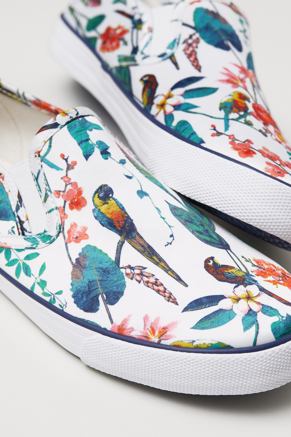
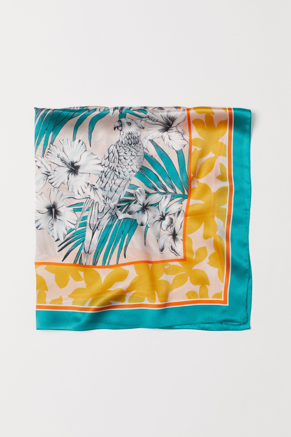
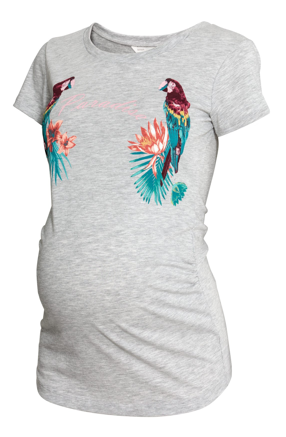
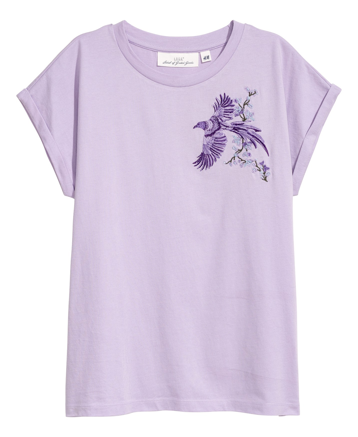
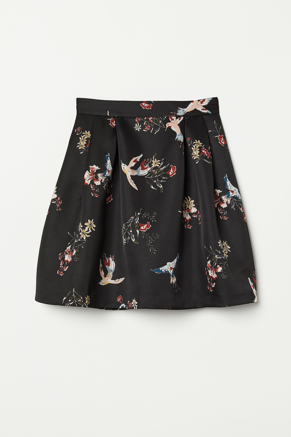
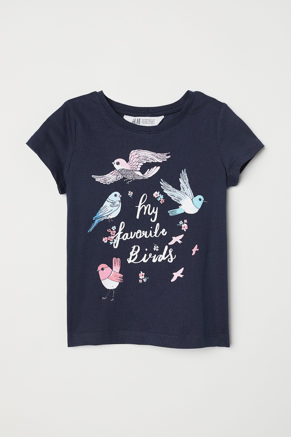
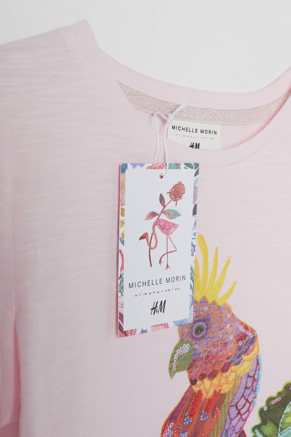
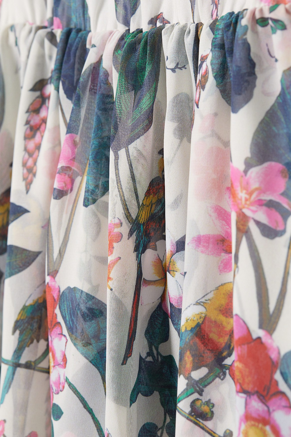
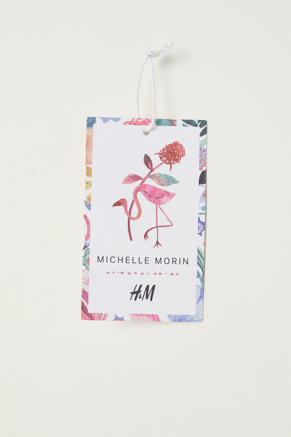

In [19]:
view_search_results(results)

In [20]:
text = "Articles with sharks, fishes or whales on it"

results = visual_search_text(index_name, text, topn=9)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0696356004.jpg | 🔗 Cosine Similarity = 0.60860
✅ Top 02: fashion/0627395002.jpg | 🔗 Cosine Similarity = 0.60829
✅ Top 03: fashion/0645879001.jpg | 🔗 Cosine Similarity = 0.60765
✅ Top 04: fashion/0696356022.jpg | 🔗 Cosine Similarity = 0.60610
✅ Top 05: fashion/0696991008.jpg | 🔗 Cosine Similarity = 0.60571
✅ Top 06: fashion/0692833005.jpg | 🔗 Cosine Similarity = 0.60533
✅ Top 07: fashion/0623397002.jpg | 🔗 Cosine Similarity = 0.60515
✅ Top 08: fashion/0697813035.jpg | 🔗 Cosine Similarity = 0.60437
✅ Top 09: fashion/0693720001.jpg | 🔗 Cosine Similarity = 0.60427




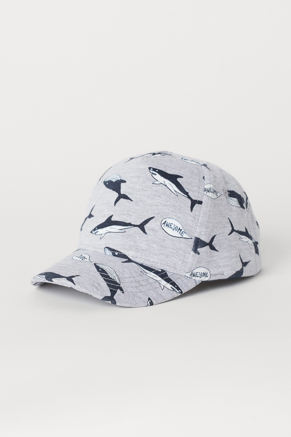
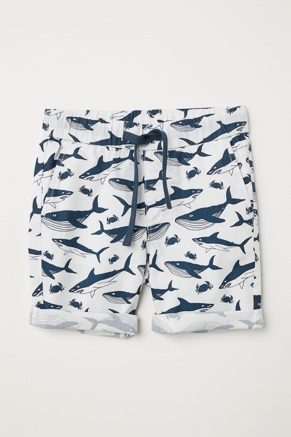
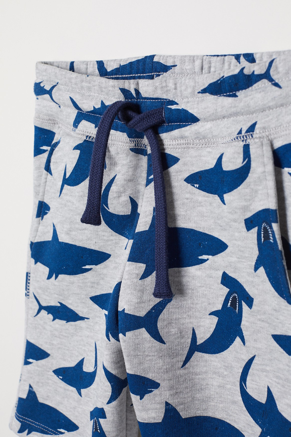
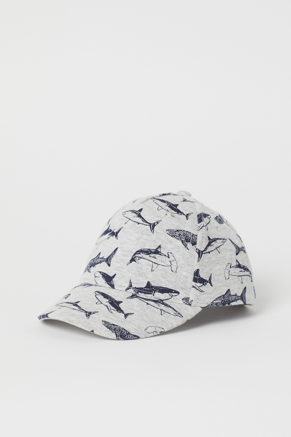
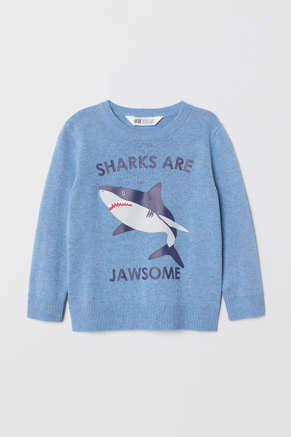
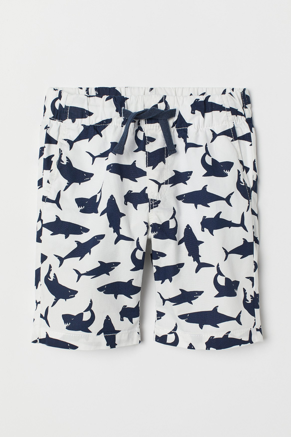
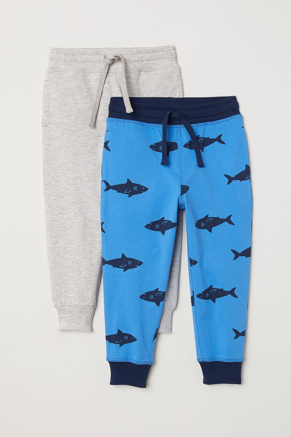
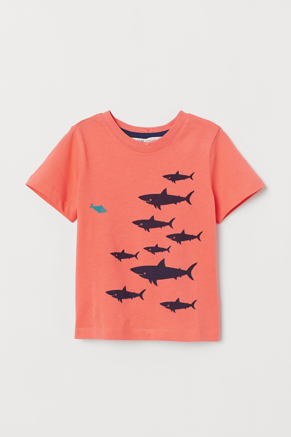
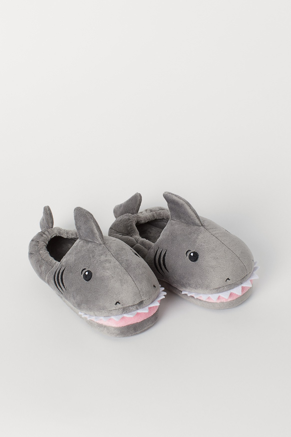

In [21]:
view_search_results(results)

In [22]:
text = "Ray ban with leopard frames"

results = visual_search_text(index_name, text, topn=9)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0646756002.jpg | 🔗 Cosine Similarity = 0.61254
✅ Top 02: fashion/0696729002.jpg | 🔗 Cosine Similarity = 0.60700
✅ Top 03: fashion/0646754002.jpg | 🔗 Cosine Similarity = 0.60510
✅ Top 04: fashion/0623350004.jpg | 🔗 Cosine Similarity = 0.60420
✅ Top 05: fashion/0696732003.jpg | 🔗 Cosine Similarity = 0.60378
✅ Top 06: fashion/0620139003.jpg | 🔗 Cosine Similarity = 0.60374
✅ Top 07: fashion/0698480001.jpg | 🔗 Cosine Similarity = 0.60280
✅ Top 08: fashion/0698480004.jpg | 🔗 Cosine Similarity = 0.60153
✅ Top 09: fashion/0696737001.jpg | 🔗 Cosine Similarity = 0.59874




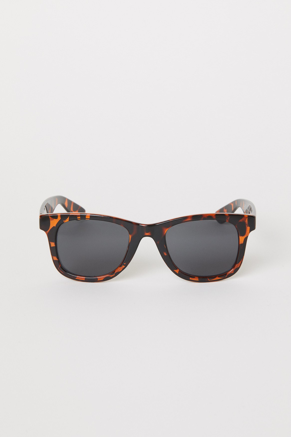
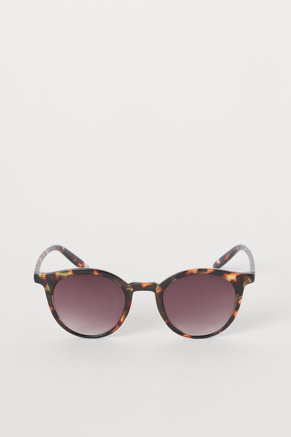
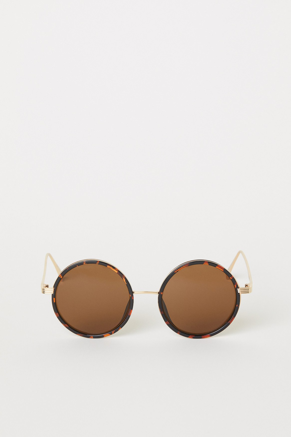
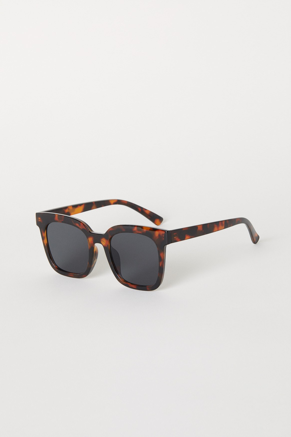
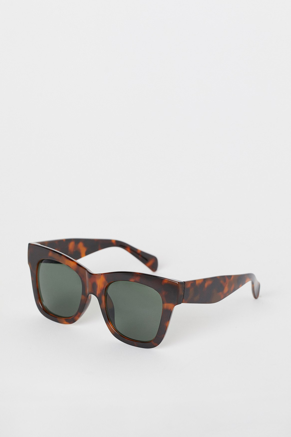
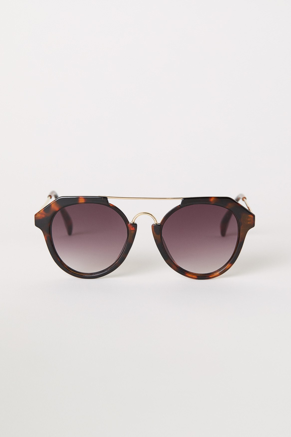
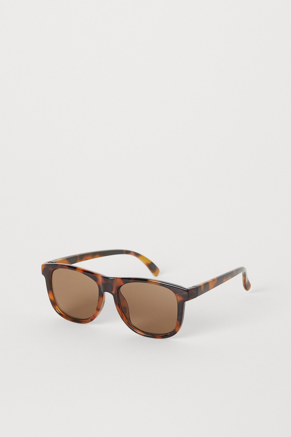
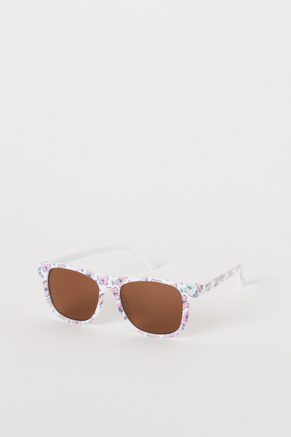
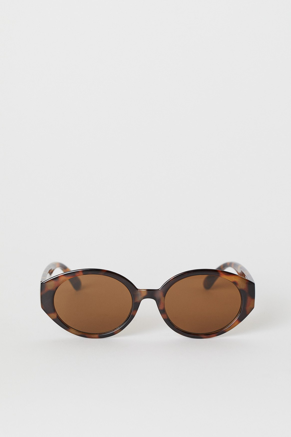

In [23]:
view_search_results(results)

In [24]:
text = "Show me some articles with Italian names"

results = visual_search_text(index_name, text, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0642051001.jpg | 🔗 Cosine Similarity = 0.59634
✅ Top 02: fashion/0698273004.jpg | 🔗 Cosine Similarity = 0.59529
✅ Top 03: fashion/0642051002.jpg | 🔗 Cosine Similarity = 0.59447
✅ Top 04: fashion/0698328006.jpg | 🔗 Cosine Similarity = 0.59329
✅ Top 05: fashion/0646592011.jpg | 🔗 Cosine Similarity = 0.59248
✅ Top 06: fashion/0646182001.jpg | 🔗 Cosine Similarity = 0.59222




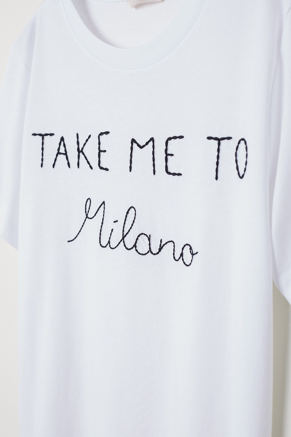
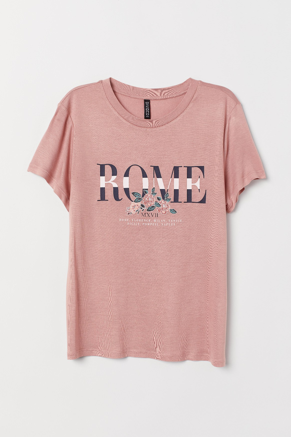
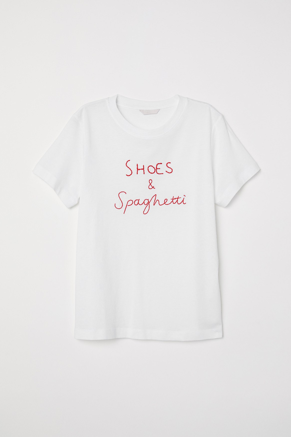
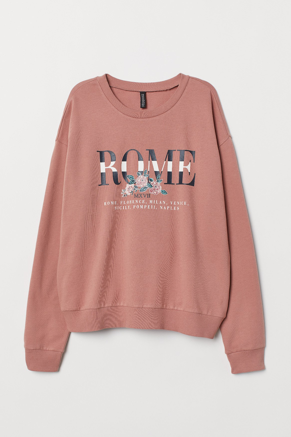
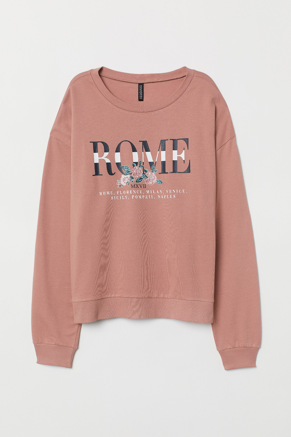
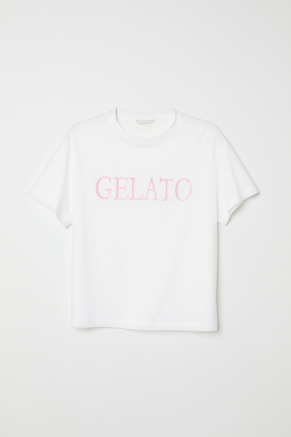

In [25]:
view_search_results(results)

In [26]:
text = "Show me some articles with some Japanese text on it"

results = visual_search_text(index_name, text, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0641748010.jpg | 🔗 Cosine Similarity = 0.59834
✅ Top 02: fashion/0625877004.jpg | 🔗 Cosine Similarity = 0.59493
✅ Top 03: fashion/0625877003.jpg | 🔗 Cosine Similarity = 0.59450
✅ Top 04: fashion/0625877006.jpg | 🔗 Cosine Similarity = 0.59450
✅ Top 05: fashion/0622678005.jpg | 🔗 Cosine Similarity = 0.59317
✅ Top 06: fashion/0641748011.jpg | 🔗 Cosine Similarity = 0.59280




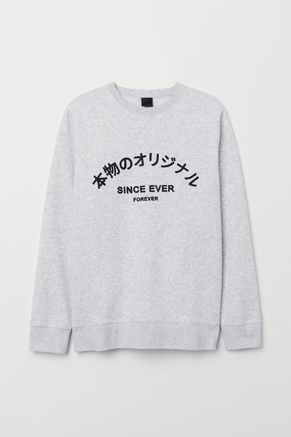
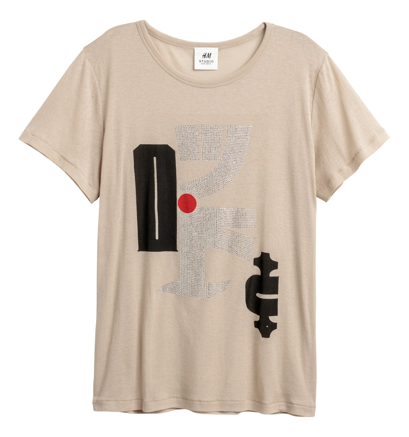
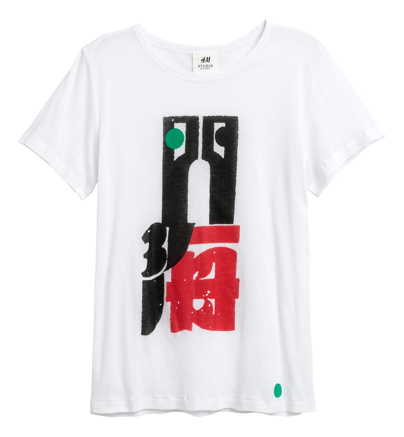
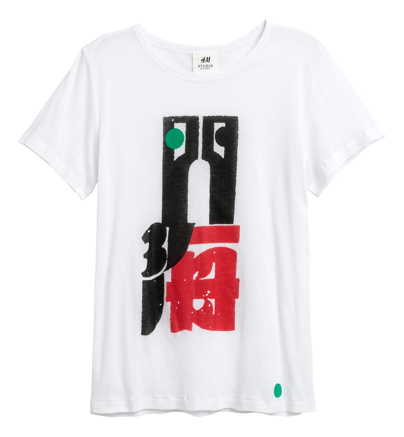
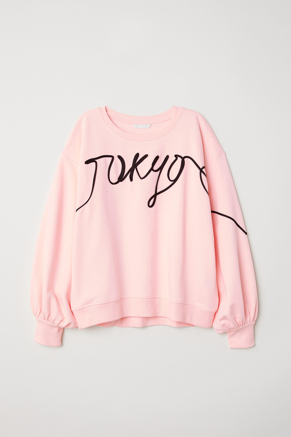
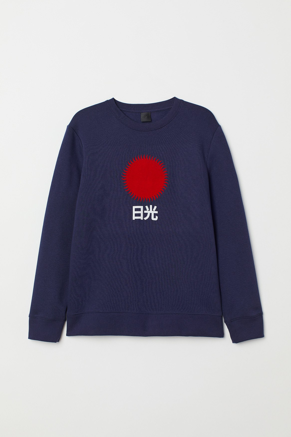

In [27]:
view_search_results(results)

## 4. Visual search using a reference image

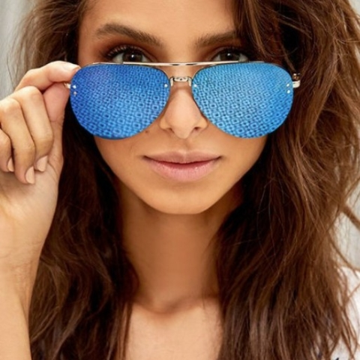

In [28]:
query_image = os.path.join(IMAGES_TEST_DIR, "image1.jpg")

img = Image.open(query_image).resize((360,360))
img

In [29]:
results = visual_search_image(index_name, query_image, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0699325004.jpg | 🔗 Cosine Similarity = 0.80350
✅ Top 02: fashion/0647236001.jpg | 🔗 Cosine Similarity = 0.79693
✅ Top 03: fashion/0694669002.jpg | 🔗 Cosine Similarity = 0.79230
✅ Top 04: fashion/0694748001.jpg | 🔗 Cosine Similarity = 0.78844
✅ Top 05: fashion/0625146001.jpg | 🔗 Cosine Similarity = 0.78696
✅ Top 06: fashion/0398959003.jpg | 🔗 Cosine Similarity = 0.78645




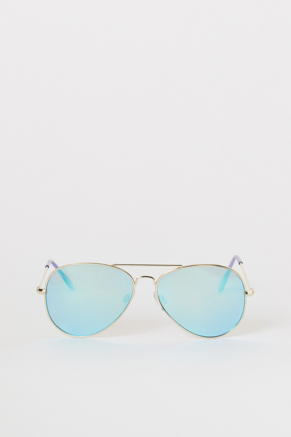
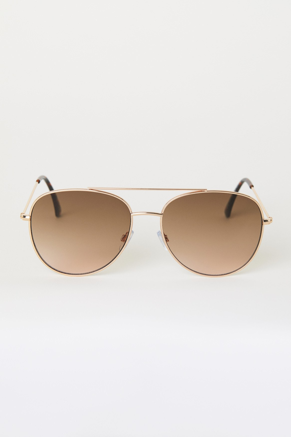
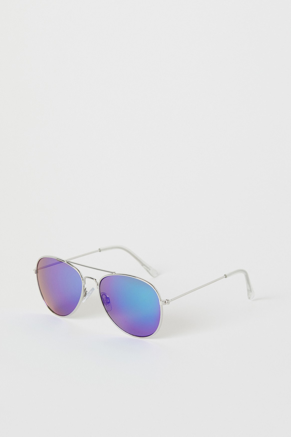
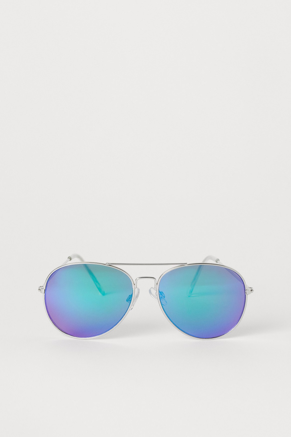
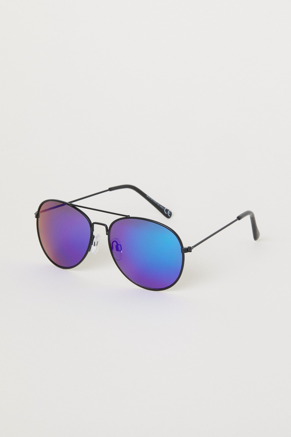
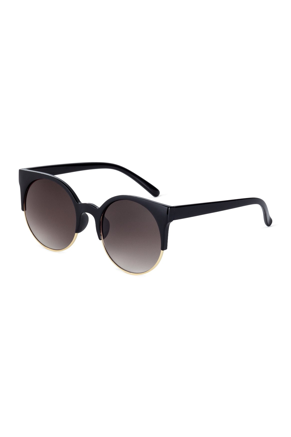

In [30]:
view_search_results(results)

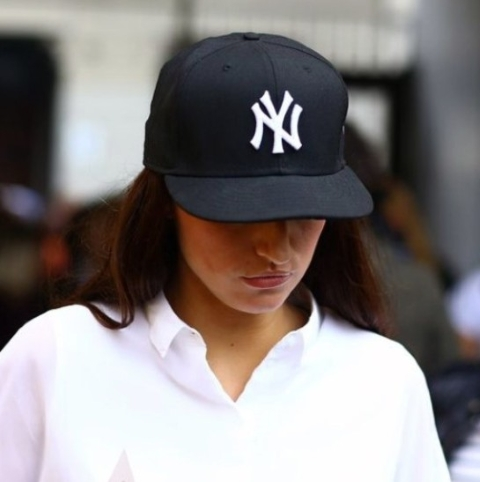

In [31]:
query_image = os.path.join(IMAGES_TEST_DIR, "image2.jpg")

img = Image.open(query_image)
img

In [32]:
results = visual_search_image(index_name, query_image, topn=3)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0625068002.jpg | 🔗 Cosine Similarity = 0.80744
✅ Top 02: fashion/0694659051.jpg | 🔗 Cosine Similarity = 0.78246
✅ Top 03: fashion/0694739001.jpg | 🔗 Cosine Similarity = 0.77503




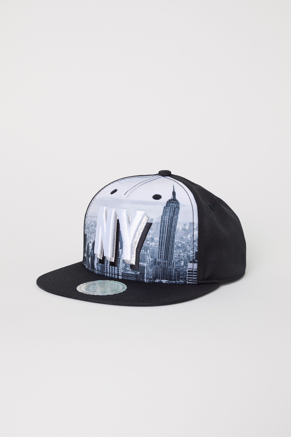
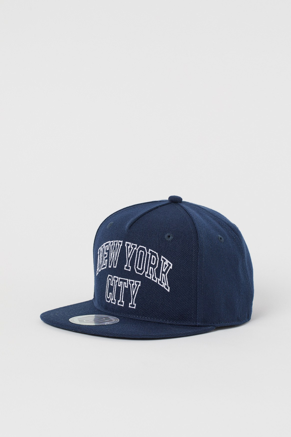
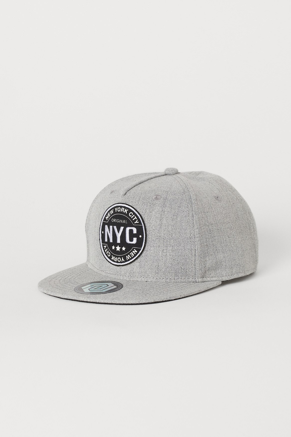

In [33]:
view_search_results(results)

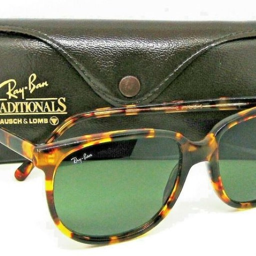

In [34]:
query_image = os.path.join(IMAGES_TEST_DIR, "image3.jpg")

img = Image.open(query_image)
img.resize((256,256))

In [35]:
results = visual_search_image(index_name, query_image, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0646756002.jpg | 🔗 Cosine Similarity = 0.79800
✅ Top 02: fashion/0696732003.jpg | 🔗 Cosine Similarity = 0.78887
✅ Top 03: fashion/0623350004.jpg | 🔗 Cosine Similarity = 0.78819
✅ Top 04: fashion/0698480001.jpg | 🔗 Cosine Similarity = 0.78682
✅ Top 05: fashion/0394292006.jpg | 🔗 Cosine Similarity = 0.77862
✅ Top 06: fashion/0696729002.jpg | 🔗 Cosine Similarity = 0.77737




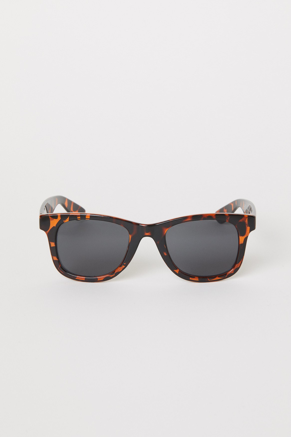
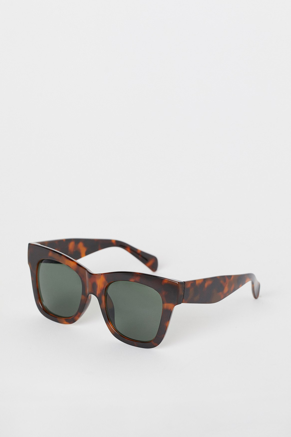
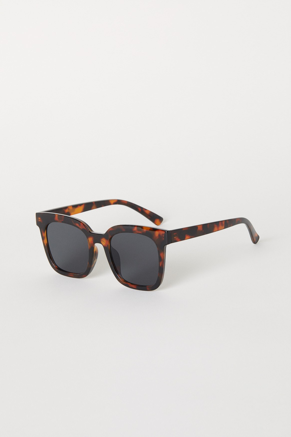
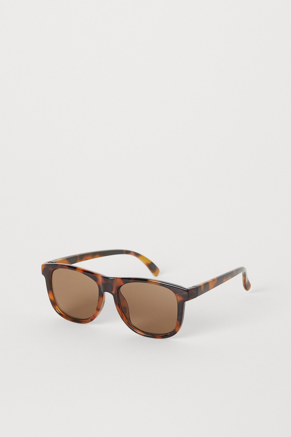
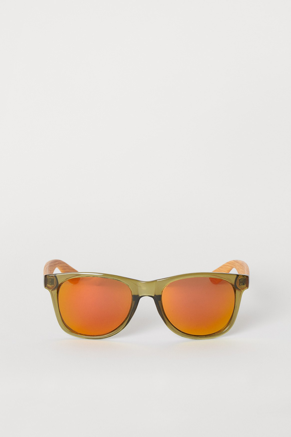
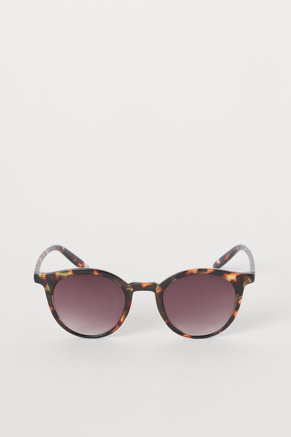

In [36]:
view_search_results(results)

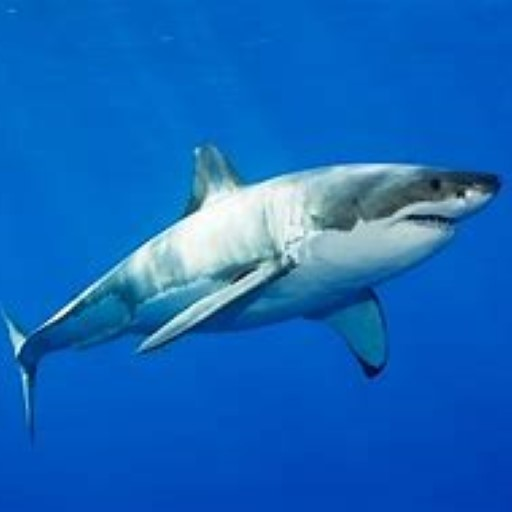

In [37]:
query_image = os.path.join(IMAGES_TEST_DIR, "image4.jpg")

img = Image.open(query_image)
img

In [38]:
results = visual_search_image(index_name, query_image, topn=6)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0693720001.jpg | 🔗 Cosine Similarity = 0.75850
✅ Top 02: fashion/0694659019.jpg | 🔗 Cosine Similarity = 0.74681
✅ Top 03: fashion/0627395002.jpg | 🔗 Cosine Similarity = 0.74514
✅ Top 04: fashion/0640162007.jpg | 🔗 Cosine Similarity = 0.74375
✅ Top 05: fashion/0626947001.jpg | 🔗 Cosine Similarity = 0.73963
✅ Top 06: fashion/0645879001.jpg | 🔗 Cosine Similarity = 0.73625




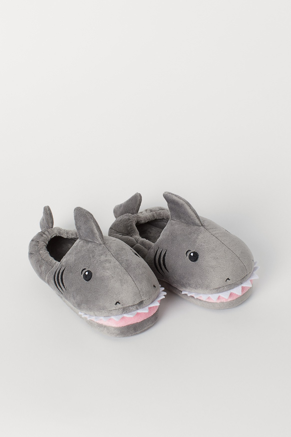
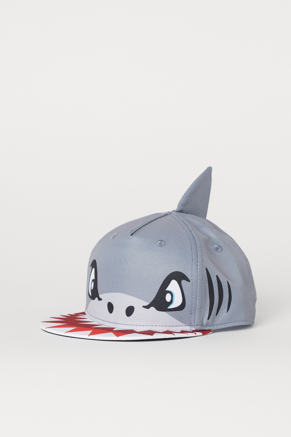
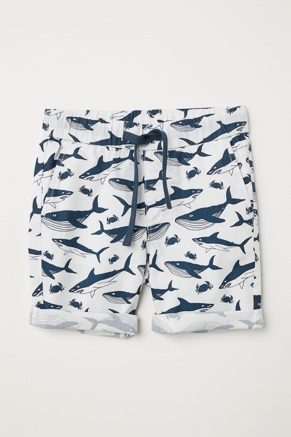
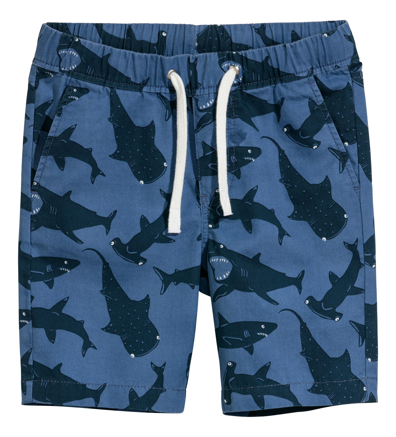
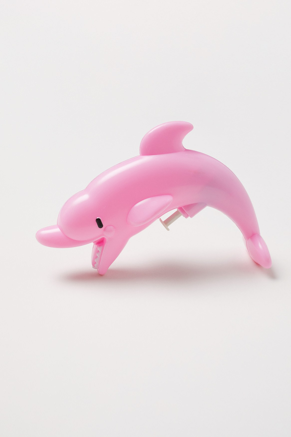
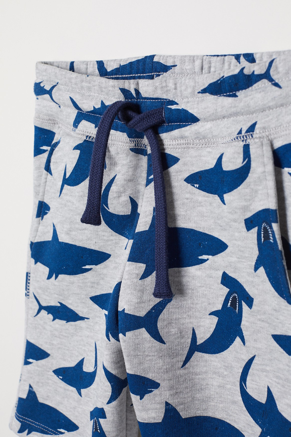

In [39]:
view_search_results(results)

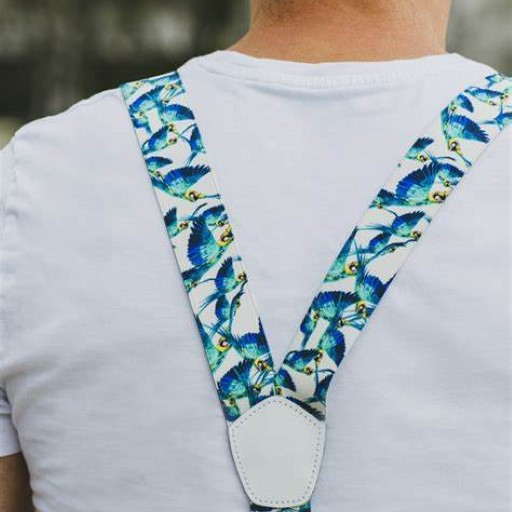

In [40]:
query_image = os.path.join(IMAGES_TEST_DIR, "image5.jpg")

img = Image.open(query_image)
img

In [41]:
results = visual_search_image(index_name, query_image, topn=3)


🔍 Top Image Results (Sorted by Cosine Similarity):

✅ Top 01: fashion/0694729001.jpg | 🔗 Cosine Similarity = 0.81759
✅ Top 02: fashion/0642775001.jpg | 🔗 Cosine Similarity = 0.80917
✅ Top 03: fashion/0694677001.jpg | 🔗 Cosine Similarity = 0.80200




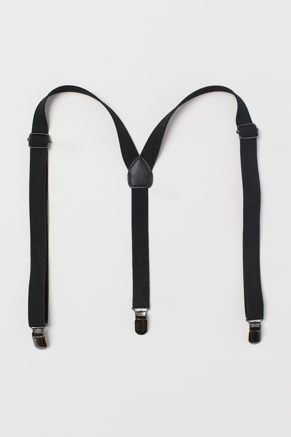
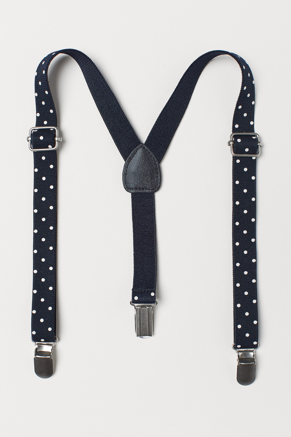
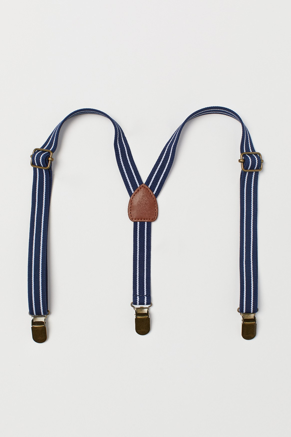

In [42]:
view_search_results(results)

> Go to the next notebook